<a href="https://colab.research.google.com/github/KIMJEONGSU/codestate17_jeongsu/blob/main/AI_17_%EA%B9%80%EC%A0%95%EC%88%98_section2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 항공사 만족도 예측

- 신생 LCC가 가파른 시장 성장세를 이어나갈 것이라는 전망과 달리 항공업계에선 우려가 만만치 않다. 신규 LCC 합류로 소비자들의 선택 폭은 넓어질 수 있지만 공급과잉과 과당경쟁에 따른 수익성 악화로 이어질 수 있다는 시각이 우세하다.   
소비자들이 우리 항공사를 선택할 수 있도록 수익성을 높이고 한다. 고객 만족도 예측을 통해 불만 사항이 있다면 개선하려한다. 
- 데이터 : 캐글   
- columns info   

성별(Age): 승객의 성별(여성, 남성)

고객 유형: 고객 유형(충성 고객, 불충성 고객)

연령: 승객의 실제 나이

여행의 종류 : 승객의 비행목적(개인여행, 출장)

클래스: 승객의 기내 여행 클래스(비즈니스, 에코, 에코 플러스)

비행 거리: 이번 여정의 비행 거리

기내 와이파이 서비스: 기내 와이파이 서비스에 대한 만족도 (0:해당 없음;1-5)

편리한 출발/도착시간 : 편리한 출발/도착시간 만족도

온라인 예약의 용이성: 온라인 예약의 만족도

Gate 위치 : Gate 위치 만족도

식음료 : 식음료 만족도

온라인 탑승 : 온라인 탑승 만족도

착좌감 : 착좌감 만족도

기내 엔터테인먼트: 기내 엔터테인먼트 만족도

기내 서비스 : 기내 서비스 만족도

레그룸 서비스 : 레그룸 서비스 만족도

수하물 처리 : 수하물 처리 만족도

체크인 서비스 : 체크인 서비스 만족도

기내 서비스 : 기내 서비스 만족도

청결도 : 청결도에 대한 만족도

출발 지연 시간(분): 출발 시 지연된 시간(분)

도착 지연 시간(분): 도착 시 지연 시간(분)

만족도: 항공사 만족도(만족, 보통 또는 불만족)

## 데이터 분석 준비

In [1]:
!pip install category_encoders
!pip3 install xgboost==1.7.2
!pip3 install hyperopt
!pip install pdpbox
!pip3 install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 KB 1.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 MB 2.8 MB/s eta 0:00:00
  Attempting uninstall: xgboost
    Found existing installation: xgboost 0.90
    Uninstalling xgboost-0.90:
      Successfully uninstalled xgboost-0.90
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.0/34.0 MB 12.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.8/37.8 MB 15.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Cre

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 KB 16.0 MB/s eta 0:00:00
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=9ae2a860d76aabef13c831cedd039d7a9e9d33deb9bac280e3e4e1c7e5f9a8cb
  Stored in directory: /root/.cache/pip/wheels/85/ac/25/ffcd87ef8f9b1eec324fdf339359be71f22612459d8c75d89c
Successfully built eli5
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
notebook 5.7.16 requires jinja2<=3.0.0, but you have jinja2 3.1.2 which is incompatib

In [35]:
# 분석을 위한 라이브러리
import numpy as np
import pandas as pd

# 시각화를 위한 라이브러리
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')   # 그래프 스타일
sns.set_style('whitegrid')  # 그래프 스타일

# 에러메세지 안나오게
import warnings
warnings.filterwarnings('ignore')

# ML
from category_encoders import OneHotEncoder, OrdinalEncoder
from sklearn.impute import SimpleImputer
from xgboost import XGBClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.datasets import make_classification
from sklearn.metrics import classification_report, recall_score, precision_score, f1_score, accuracy_score
pd.options.display.float_format = '{:,.2f}'.format
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
from eli5.sklearn import PermutationImportance
import eli5

In [3]:
#파일 업로드
from google.colab import files
files.upload()

Saving test.csv to test.csv
Saving train.csv to train.csv


{'test.csv': b',id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction\r\n0,19556,Female,Loyal Customer,52,Business travel,Eco,160,5,4,3,4,3,4,3,5,5,5,5,2,5,5,50,44.0,satisfied\r\n1,90035,Female,Loyal Customer,36,Business travel,Business,2863,1,1,3,1,5,4,5,4,4,4,4,3,4,5,0,0.0,satisfied\r\n2,12360,Male,disloyal Customer,20,Business travel,Eco,192,2,0,2,4,2,2,2,2,4,1,3,2,2,2,0,0.0,neutral or dissatisfied\r\n3,77959,Male,Loyal Customer,44,Business travel,Business,3377,0,0,0,2,3,4,4,1,1,1,1,3,1,4,0,6.0,satisfied\r\n4,36875,Female,Loyal Customer,49,Business travel,Eco,1182,2,3,4,3,4,1,2,2,2,2,2,4,2,4,0,20.0,satisfied\r\n5,39177,Male,Loyal Customer,16,Business travel

In [36]:
train = pd.read_csv('/content/train.csv',index_col=0)
test = pd.read_csv('/content/test.csv',index_col=0)

display(train.head(3), test.head(3))

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,...,5,4,3,4,4,5,5,25,18.00,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,...,1,1,5,3,1,4,1,1,6.00,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,...,5,4,3,4,4,4,5,0,0.00,satisfied


,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,19556,Female,Loyal Customer,52,Business travel,Eco,160,5,4,3,...,5,5,5,5,2,5,5,50,44.00,satisfied
1,90035,Female,Loyal Customer,36,Business travel,Business,2863,1,1,3,...,4,4,4,4,3,4,5,0,0.00,satisfied
2,12360,Male,disloyal Customer,20,Business travel,Eco,192,2,0,2,...,2,4,1,3,2,2,2,0,0.00,neutral or dissatisfied


## 데이터 파악

In [37]:
print(train.shape, test.shape)

(103904, 24) (25976, 24)


In [38]:
train.dtypes

id                                     int64
Gender                                object
Customer Type                         object
Age                                    int64
Type of Travel                        object
Class                                 object
Flight Distance                        int64
Inflight wifi service                  int64
Departure/Arrival time convenient      int64
Ease of Online booking                 int64
Gate location                          int64
Food and drink                         int64
Online boarding                        int64
Seat comfort                           int64
Inflight entertainment                 int64
On-board service                       int64
Leg room service                       int64
Baggage handling                       int64
Checkin service                        int64
Inflight service                       int64
Cleanliness                            int64
Departure Delay in Minutes             int64
Arrival De

In [39]:
def check(df):
  print('--------------컬럼별 유니크값-----------------')
  print(df.nunique())
  print('----------------데이터 결측치---------------')
  print(df.isnull().sum())
  print('----------------데이터 중복값---------------')
  print(df.duplicated().sum())


In [40]:
check(train)

--------------컬럼별 유니크값-----------------
id                                   103904
Gender                                    2
Customer Type                             2
Age                                      75
Type of Travel                            2
Class                                     3
Flight Distance                        3802
Inflight wifi service                     6
Departure/Arrival time convenient         6
Ease of Online booking                    6
Gate location                             6
Food and drink                            6
Online boarding                           6
Seat comfort                              6
Inflight entertainment                    6
On-board service                          6
Leg room service                          6
Baggage handling                          5
Checkin service                           6
Inflight service                          6
Cleanliness                               6
Departure Delay in Minutes          

In [41]:
check(test)

--------------컬럼별 유니크값-----------------
id                                   25976
Gender                                   2
Customer Type                            2
Age                                     75
Type of Travel                           2
Class                                    3
Flight Distance                       3281
Inflight wifi service                    6
Departure/Arrival time convenient        6
Ease of Online booking                   6
Gate location                            5
Food and drink                           6
Online boarding                          6
Seat comfort                             5
Inflight entertainment                   6
On-board service                         6
Leg room service                         6
Baggage handling                         5
Checkin service                          5
Inflight service                         6
Cleanliness                              6
Departure Delay in Minutes             313
Arrival Delay 

* 중복값은 없고, 현재 데이터가 적은 상태는 아니므로 결측치 삭제.
* 해당 문제는 분류 문제로 카디널리티가 너무 높은 컬럼은 삭제해준다.

In [42]:
for i in train.columns:
  print('------------------',i,'-------------------------')
  print(train[i].unique())

------------------ id -------------------------
[ 70172   5047 110028 ...  68825  54173  62567]
------------------ Gender -------------------------
['Male' 'Female']
------------------ Customer Type -------------------------
['Loyal Customer' 'disloyal Customer']
------------------ Age -------------------------
[13 25 26 61 47 52 41 20 24 12 53 33 45 38  9 17 43 58 23 57 49 36 22 31
 15 35 67 37 40 34 39 50 29 54 21 28 27 69 60 48 59 46 30 66 64 44 51 32
 19 42 16 11 62  8 56 68 55 18 65 72 70 63 10  7 14 80 74 71 85 73 76 77
 75 79 78]
------------------ Type of Travel -------------------------
['Personal Travel' 'Business travel']
------------------ Class -------------------------
['Eco Plus' 'Business' 'Eco']
------------------ Flight Distance -------------------------
[ 460  235 1142 ...  974 1479  400]
------------------ Inflight wifi service -------------------------
[3 2 4 1 5 0]
------------------ Departure/Arrival time convenient -------------------------
[4 2 5 3 1 0]
-------

In [43]:
# 결측치 처리 또는 전처리 일부
def delete_columns(df):
  # 결측치 제거
  df.drop(index = df[df['Arrival Delay in Minutes'].isnull()].index,inplace=True)
  df.drop(columns='id', inplace=True)

  # 타켓컬럼 0 또는 1로 변경.
  df['satisfaction'] = df['satisfaction'].apply(lambda x : 1 if x=='satisfied' else 0)
  return df

train = delete_columns(train)
test = delete_columns(test)

In [44]:
display(train.isnull().sum(), test.isnull().sum())

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64

* 만족도 예측이기때문에 타켓은 satisfaction으로 선정
* 가설검증을 위한 EDA 분석

In [45]:
total = pd.concat([train,test])

In [46]:
total

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.00,0
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.00,0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.00,1
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.00,0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25971,Male,disloyal Customer,34,Business travel,Business,526,3,3,3,1,...,4,3,2,4,4,5,4,0,0.00,0
25972,Male,Loyal Customer,23,Business travel,Business,646,4,4,4,4,...,4,4,5,5,5,5,4,0,0.00,1
25973,Female,Loyal Customer,17,Personal Travel,Eco,828,2,5,1,5,...,2,4,3,4,5,4,2,0,0.00,0
25974,Male,Loyal Customer,14,Business travel,Business,1127,3,3,3,3,...,4,3,2,5,4,5,4,0,0.00,1


In [ ]:
total.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129487 entries, 0 to 25975
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             129487 non-null  object 
 1   Customer Type                      129487 non-null  object 
 2   Age                                129487 non-null  int64  
 3   Type of Travel                     129487 non-null  object 
 4   Class                              129487 non-null  object 
 5   Flight Distance                    129487 non-null  int64  
 6   Inflight wifi service              129487 non-null  int64  
 7   Departure/Arrival time convenient  129487 non-null  int64  
 8   Ease of Online booking             129487 non-null  int64  
 9   Gate location                      129487 non-null  int64  
 10  Food and drink                     129487 non-null  int64  
 11  Online boarding                    12948

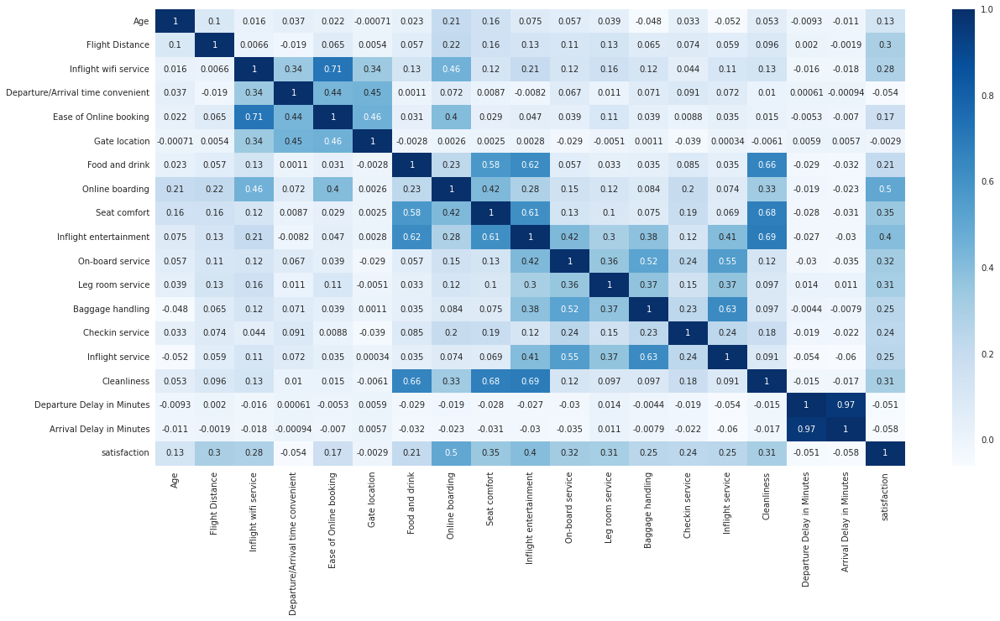

In [47]:
plt.figure(figsize=(20,10))
sns.heatmap(total.corr(),annot=True,cmap='Blues')

In [48]:
total['satisfaction'].value_counts(normalize=True)

0   0.57
1   0.43
Name: satisfaction, dtype: float64

Text(0, 0.5, '')

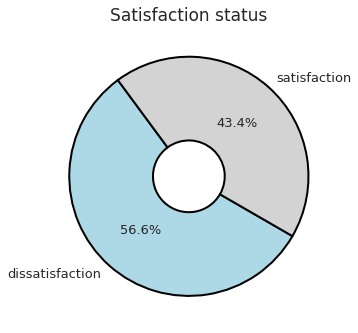

In [49]:
wedgeprops={'width': 0.7, 'edgecolor': 'black', 'linewidth': 2}
total['satisfaction'].value_counts(normalize=True).plot.pie(textprops={'size':17},colors=['lightblue','lightgrey'],autopct='%.1f%%',wedgeprops=wedgeprops,counterclock=False,startangle=-30,labels=['dissatisfaction','satisfaction'],fontsize=13)
plt.title('Satisfaction status', fontsize=17)
plt.ylabel('')

In [62]:
total.Class.value_counts()

Business    61990
Eco         58117
Eco Plus     9380
Name: Class, dtype: int64

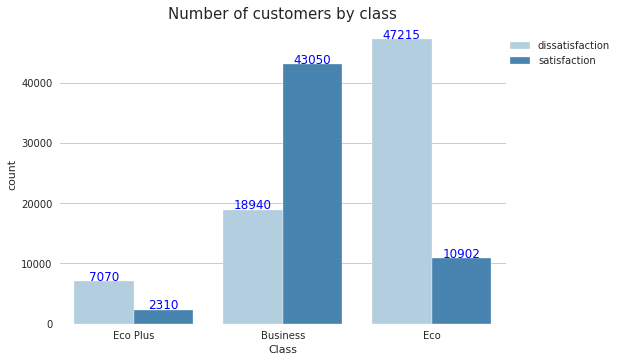

In [56]:
class_count = sns.countplot(total.Class, hue=total.satisfaction,palette='Blues')
plt.title('Number of customers by class', fontsize=15)
plt.legend(labels=['dissatisfaction','satisfaction'], loc=[1,0.85])
for patch in class_count.patches:
  class_count.text(x=patch.get_x() + patch.get_width()/2 ,y=patch.get_height() + len(total)*0.001,
                   s=f'{patch.get_height()}', ha='center',size=12, color='blue')

💡 가설검정 : 이코노미 좌석일수록 만족도가 낮다.⭕
* 이코노미와 이코노미 플러스를 이용한 고객들의 불만족도가 만족에 비해 3~4배 높다.


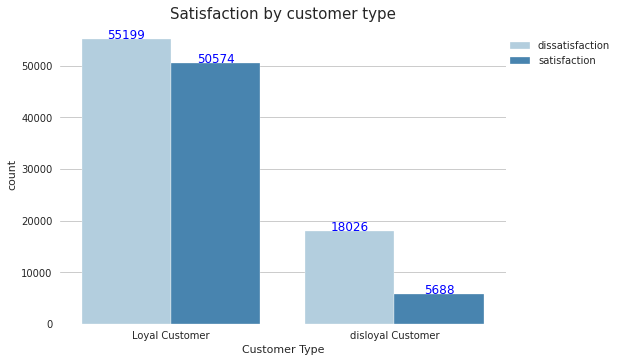

In [ ]:
type_satisfaction = sns.countplot(total['Customer Type'], hue=total['satisfaction'],palette='Blues')
plt.legend(labels=['dissatisfaction','satisfaction'], loc=[1,0.85])
plt.title('Satisfaction by customer type', fontsize=15)
for patch in type_satisfaction.patches:
  type_satisfaction.text(x=patch.get_x() + patch.get_width()/2 ,y=patch.get_height() + len(total)*0.001,
                   s=f'{patch.get_height()}', ha='center',size=12, color='blue')

In [ ]:
total[total['Customer Type']=='Loyal Customer']['satisfaction'].value_counts(normalize=True)

0   0.52
1   0.48
Name: satisfaction, dtype: float64

In [ ]:
total[total['Customer Type']=='disloyal Customer']['satisfaction'].value_counts(normalize=True)

0   0.76
1   0.24
Name: satisfaction, dtype: float64

In [ ]:
total[total['satisfaction']==0]['Customer Type'].value_counts(normalize=True)

Loyal Customer      0.75
disloyal Customer   0.25
Name: Customer Type, dtype: float64

💡 가설검정 : 충성고객의 만족도가 더 낮다.⭕
* 불만족인 고객 중 충성고객(Loyal Customer)이 75%로 충성고객의 만족도가 더 낮았다.


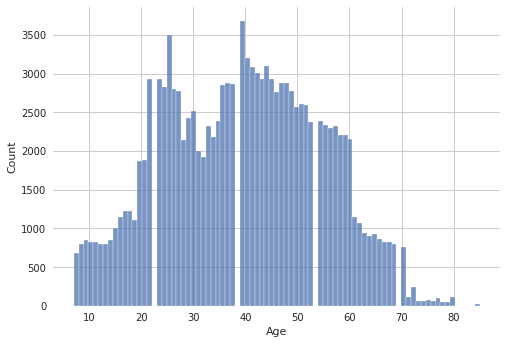

In [ ]:
sns.histplot(total.Age)

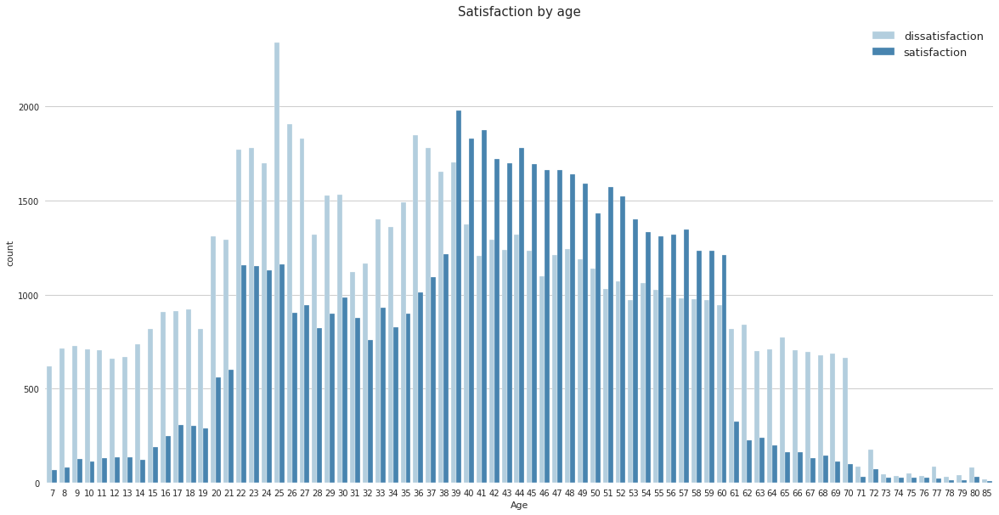

In [ ]:
plt.figure(figsize=(20,10))
sns.countplot(total.Age, hue=total.satisfaction,palette='Blues')
plt.title('Satisfaction by age', fontsize=15)
plt.legend(labels=['dissatisfaction','satisfaction'],fontsize=13)

💡 가설검정 : 연령대가 높을수록 만족도가 낮다.🔺

* 38세까지는 대체적으로 불만족도가 높고, 39세~60세까지는 만족도가 높다가 그 이후에는 다시 불만족도가 높다. 즉, 연령대가 높을수록 만족도가 무조건 낮다고 할 수 없다.

Text(0, 0.5, 'satisfaction counts')

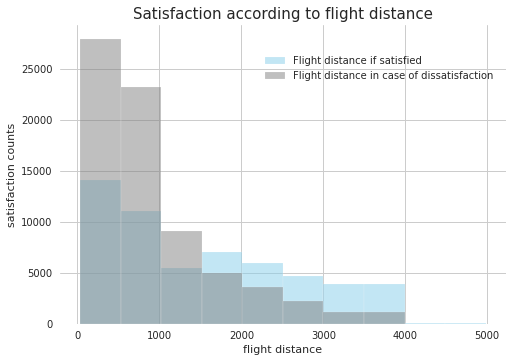

In [ ]:
total[total['satisfaction']==1]['Flight Distance'].plot.hist(alpha=0.5,color='skyblue')
total[total['satisfaction']==0]['Flight Distance'].plot.hist(alpha=0.5,color='gray')
plt.title('Satisfaction according to flight distance', fontsize=15)
plt.legend(labels=['Flight distance if satisfied','Flight distance in case of dissatisfaction'],loc=[0.45,0.8])
plt.xlabel('flight distance')
plt.ylabel('satisfaction counts')

💡비행거리가 짧을 수록 만족도가 낮다.⭕
* 비행거리가 짧은 경우 만족도가 더 낮고, 비행거리가 길수록 만족도가 높다.

In [7]:
target='satisfaction'

* train set을 train 과 val로 나누기! _ hold out 기법

In [8]:
train, val = train_test_split(train, test_size=0.3, random_state=2)

In [9]:
print(f'train : {train.shape}')
print(f'val : {val.shape}')
print(f'test : {test.shape}')

train : (72515, 23)
val : (31079, 23)
test : (25893, 23)


In [10]:
def div_data(df):
  target='satisfaction'
  X=df.drop(target, axis=1)
  y=df[target]
  return X,y

X_train, y_train = div_data(train)
X_val, y_val = div_data(val)
X_test, y_test = div_data(test)

print(f'X_train : {X_train.shape},y_train : {y_train.shape}')
print(f'X_val : {X_val.shape},y_val : {y_val.shape}')
print(f'X_test : {X_test.shape},y_test : {y_test.shape}')

X_train : (72515, 22),y_train : (72515,)
X_val : (31079, 22),y_val : (31079,)
X_test : (25893, 22),y_test : (25893,)


* 타켓값의 비율 확인

In [11]:
y_train.value_counts(normalize=True)

# 타켓값 비율이 불균형하진 않다.
# 기준모델의 

0   0.57
1   0.43
Name: satisfaction, dtype: float64

## 1. **기준모델**, 기준모델 성능 체크 -> **로지스틱회귀모델**을 기준모델로 변경

In [ ]:
base=y_train.mode()[0]
baseline = [base] * len(y_train)

print(f'기준모델의 정확도 : {accuracy_score(y_train, baseline)}')
print(f'기준모델의 f1-score : {f1_score(y_train, baseline)}')

기준모델의 정확도 : 0.5660346135282356
기준모델의 f1-score : 0.0


## 2. **로지스틱 회귀모델**   
* L2 패널티가 적용되있기 때문에, 스케일링 필수

In [ ]:
pipe_logistic = make_pipeline(OrdinalEncoder(), 
                              StandardScaler(),  
                              LogisticRegression(random_state=2),)
pipe_logistic.fit(X_train, y_train)

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['Gender', 'Customer Type',
                                      'Type of Travel', 'Class'],
                                mapping=[{'col': 'Gender',
                                          'data_type': dtype('O'),
                                          'mapping': Male      1
Female    2
NaN      -2
dtype: int64},
                                         {'col': 'Customer Type',
                                          'data_type': dtype('O'),
                                          'mapping': Loyal Customer       1
disloyal Customer    2
NaN                 -2
dtype: int64},
                                         {'col': 'Type of Travel',
                                          'data_type': dtype('O'),
                                          'mapping': Personal Travel    1
Business travel    2
NaN               -2
dtype: int64},
                                         {'col': 'Class',
           

In [ ]:
# 예측 및 정확도 확인
y_train_logistic = pipe_logistic.predict(X_train)
y_val_logistic = pipe_logistic.predict(X_val)

In [ ]:
print('-------------------------train-----------------------')
print(classification_report(y_train, y_train_logistic))
print('-------------------------val-------------------------')
print(classification_report(y_val, y_val_logistic))

-------------------------train-----------------------
              precision    recall  f1-score   support

           0       0.88      0.91      0.89     41046
           1       0.87      0.83      0.85     31469

    accuracy                           0.87     72515
   macro avg       0.87      0.87      0.87     72515
weighted avg       0.87      0.87      0.87     72515

-------------------------val-------------------------
              precision    recall  f1-score   support

           0       0.88      0.90      0.89     17651
           1       0.86      0.83      0.85     13428

    accuracy                           0.87     31079
   macro avg       0.87      0.87      0.87     31079
weighted avg       0.87      0.87      0.87     31079



Text(0.5, 1.0, 'confusion_matrix in logistic regression model')

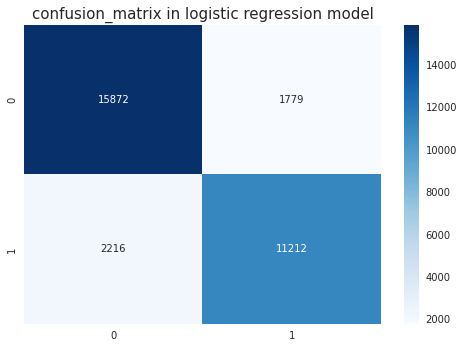

In [ ]:
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(y_val,y_val_logistic),cmap=plt.cm.Blues, annot=True,fmt="d")
plt.title('confusion_matrix in logistic regression model',fontsize=15)

* 현재 우리가 해결하려는 문제는 만족도 예측을 통해 불만사항이 있다면 개선해나가는 것이다. 이 때문에 만족도 예측결과가 0(불만족)인데 1(만족)로 예측하는 것을 줄이는게 중요하다고 생각한다.
* 즉, 재현율을 높이는데 중요한 문제다.


* 과적합 없이 0.87의 정확도, 0.85 f1-score를 얻었다.

## 3. **의사결정 트리**

In [ ]:
pipe_DecisionTree = make_pipeline(
    OrdinalEncoder(),
    DecisionTreeClassifier(random_state=2, criterion="entropy",max_depth=6),
)
pipe_DecisionTree.fit(X_train, y_train)

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['Gender', 'Customer Type',
                                      'Type of Travel', 'Class'],
                                mapping=[{'col': 'Gender',
                                          'data_type': dtype('O'),
                                          'mapping': Male      1
Female    2
NaN      -2
dtype: int64},
                                         {'col': 'Customer Type',
                                          'data_type': dtype('O'),
                                          'mapping': Loyal Customer       1
disloyal Customer    2
NaN                 -2
dtype: int64},
                                         {'col': 'Type of Travel',
                                          'data_type': dtype('O'),
                                          'mapping': Personal Travel    1
Business travel    2
NaN               -2
dtype: int64},
                                         {'col': 'Class',
           

In [ ]:
# 예측 및 정확도 확인
y_train_DecisionTree = pipe_DecisionTree.predict(X_train)
y_val_DecisionTree = pipe_DecisionTree.predict(X_val)

In [ ]:
print('-------------------------train-----------------------')
print(classification_report(y_train, y_train_DecisionTree))
print('-------------------------val-------------------------')
print(classification_report(y_val, y_val_DecisionTree))

-------------------------train-----------------------
              precision    recall  f1-score   support

           0       0.94      0.92      0.93     41046
           1       0.89      0.93      0.91     31469

    accuracy                           0.92     72515
   macro avg       0.92      0.92      0.92     72515
weighted avg       0.92      0.92      0.92     72515

-------------------------val-------------------------
              precision    recall  f1-score   support

           0       0.95      0.91      0.93     17651
           1       0.89      0.93      0.91     13428

    accuracy                           0.92     31079
   macro avg       0.92      0.92      0.92     31079
weighted avg       0.92      0.92      0.92     31079



Text(0.5, 1.0, 'confusion_matrix in DecisionTree model')

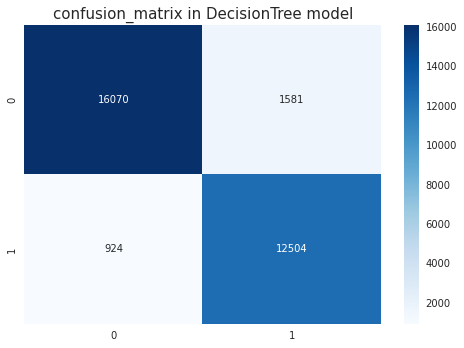

In [ ]:
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(y_val,y_val_DecisionTree),cmap=plt.cm.Blues, annot=True,fmt="d")
plt.title('confusion_matrix in DecisionTree model',fontsize=15)

## 4. **랜덤포레스트**

In [ ]:
pipe_randomforest = make_pipeline(OrdinalEncoder(),RandomForestClassifier(random_state=2, oob_score=True, n_jobs=-1,max_depth=6),)
pipe_randomforest.fit(X_train,y_train)

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['Gender', 'Customer Type',
                                      'Type of Travel', 'Class'],
                                mapping=[{'col': 'Gender',
                                          'data_type': dtype('O'),
                                          'mapping': Male      1
Female    2
NaN      -2
dtype: int64},
                                         {'col': 'Customer Type',
                                          'data_type': dtype('O'),
                                          'mapping': Loyal Customer       1
disloyal Customer    2
NaN                 -2
dtype: int64},
                                         {'col': 'Type of Travel',
                                          'data_type': dtype('O'),
                                          'mapping': Personal Travel    1
Business travel    2
NaN               -2
dtype: int64},
                                         {'col': 'Class',
           

In [ ]:
# 예측 및 정확도 확인
y_train_randomforest = pipe_randomforest.predict(X_train)
y_val_randomforest = pipe_randomforest.predict(X_val)

In [ ]:
print('-------------------------train-----------------------')
print(classification_report(y_train, y_train_randomforest))
print('-------------------------val-------------------------')
print(classification_report(y_val, y_val_randomforest))

-------------------------train-----------------------
              precision    recall  f1-score   support

           0       0.93      0.94      0.94     41046
           1       0.93      0.91      0.92     31469

    accuracy                           0.93     72515
   macro avg       0.93      0.93      0.93     72515
weighted avg       0.93      0.93      0.93     72515

-------------------------val-------------------------
              precision    recall  f1-score   support

           0       0.93      0.94      0.94     17651
           1       0.92      0.91      0.92     13428

    accuracy                           0.93     31079
   macro avg       0.93      0.93      0.93     31079
weighted avg       0.93      0.93      0.93     31079



Text(0.5, 1.0, 'confusion_matrix in randomforest model')

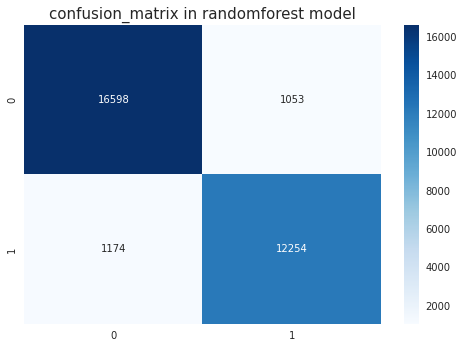

In [ ]:
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(y_val,y_val_randomforest),cmap=plt.cm.Blues, annot=True,fmt="d")
plt.title('confusion_matrix in randomforest model',fontsize=15)

* train 의 정확도가 더 높은 걸 봐선 과적합이 조금 있다.   
train의 정확도 1, val의 정확도 0.95   
maxdepth=6을 줘서 과적합을 해소하고, 정확도는 모두 0.93가 되었다.
* 하지만 의사결정 트리와 비교했을땐, 성능이 훨씬 좋아졌다.
* 의사결정 트리는 훈련데이터셋에 제약사항이 없어서 굉장히 유연한 모델이라 과적합이 잘 일어난다. 이런 문제점을 해결한 모델이 랜덤포레스트다. 
* 랜덤포레스트는 배깅을 대표하는 모델이다. 기본모델인 결정 트리들을 독립적으로 만들어지며 각각의 기본 모델이 랜덤으로 예측하는 성능보다 좋을 경우 이 기본 모델을 합치는 과정에서 에러가 상쇄되어 랜덤포레스트는 더 정확한 예측이 가능하다.

## 4. **XGBoost** + 하이퍼파라미터 튜닝

In [12]:
pipe_xgboost = make_pipeline(OrdinalEncoder(),XGBClassifier(random_state=2),)


params = {
    "xgbclassifier__max_depth": [3,4,5,6,7,8],
}


#1. Exhaustive Grid Search
from sklearn.model_selection import GridSearchCV
grid_xgboost = GridSearchCV(pipe_xgboost, param_grid=params, scoring="roc_auc", cv=3, verbose=3)

grid_xgboost.fit(X_train,y_train)
# pipe_xgboost.fit(X_train,y_train)
print("최적 하이퍼파라미터: ", grid_xgboost.best_params_)
print("최적 AUC: ", grid_xgboost.best_score_)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END ........xgbclassifier__max_depth=3;, score=0.992 total time=   4.7s
[CV 2/3] END ........xgbclassifier__max_depth=3;, score=0.992 total time=   2.9s


KeyboardInterrupt: ignored

In [13]:
pipe_xgboost = make_pipeline(OrdinalEncoder(),XGBClassifier(random_state=2,max_depth=6),)
pipe_xgboost.fit(X_train,y_train)

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['Gender', 'Customer Type',
                                      'Type of Travel', 'Class'],
                                mapping=[{'col': 'Gender',
                                          'data_type': dtype('O'),
                                          'mapping': Male      1
Female    2
NaN      -2
dtype: int64},
                                         {'col': 'Customer Type',
                                          'data_type': dtype('O'),
                                          'mapping': Loyal Customer       1
disloyal Customer    2
NaN                 -2
dtype: int64},
                                         {'col': 'Type of Travel',
                                          'data_type': dtype('O'),
                                          'mapping':...
                               feature_types=None, gamma=0, gpu_id=-1,
                               grow_policy='depthwise', importance_type=N

In [14]:
# 예측 및 정확도 확인
y_train_xgboost = pipe_xgboost.predict(X_train)
y_val_xgboost = pipe_xgboost.predict(X_val)

In [15]:
print('-------------------------train-----------------------')
print(classification_report(y_train, y_train_xgboost))
print('-------------------------val-------------------------')
print(classification_report(y_val, y_val_xgboost))

-------------------------train-----------------------
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     41046
           1       0.99      0.96      0.97     31469

    accuracy                           0.98     72515
   macro avg       0.98      0.98      0.98     72515
weighted avg       0.98      0.98      0.98     72515

-------------------------val-------------------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     17651
           1       0.97      0.94      0.96     13428

    accuracy                           0.96     31079
   macro avg       0.96      0.96      0.96     31079
weighted avg       0.96      0.96      0.96     31079



Text(0.5, 1.0, 'confusion_matrix in xgboost model')

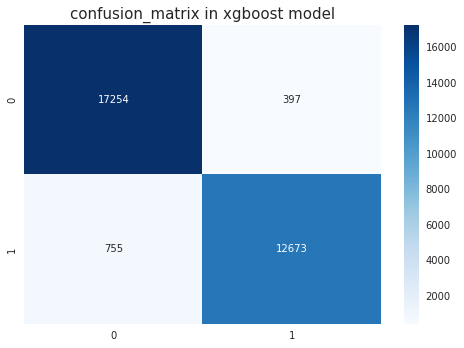

In [16]:
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(y_val,y_val_xgboost),cmap=plt.cm.Blues, annot=True,fmt="d")
plt.title('confusion_matrix in xgboost model',fontsize=15)

* XGBoost 모델도 약간의 과적합이 있었다. 이를 해소하고자 max_depth 하이퍼 파라미터를 설정해주었고, 정확도는 0.96이다.
* XGBoost는 회귀와 분류문제에 모두 사용할 수 있고, 특히, 틀린 데이터에 집중하기 위해 가중 샘플링을 하는 대신 잔차를 학습한다. 
* 잔차가 큰 관측치를 더 학습하도록 하는 효과가 있으며, 이전 모델이 틀린만큼을 직접 학습하며 이전 모델을 순차적으로 보완한다.

## 4. **최종모델 선정 _ XGBoost**

In [17]:
#  test set 
y_test_xgboost = pipe_xgboost.predict(X_test)
print(classification_report(y_test, y_test_xgboost))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97     14528
           1       0.97      0.94      0.96     11365

    accuracy                           0.96     25893
   macro avg       0.96      0.96      0.96     25893
weighted avg       0.96      0.96      0.96     25893



Text(0.5, 1.0, 'confusion_matrix in xgboost model')

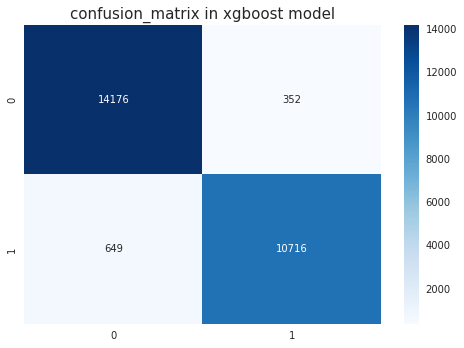

In [18]:
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(y_test,y_test_xgboost),cmap=plt.cm.Blues, annot=True,fmt="d")
plt.title('confusion_matrix in xgboost model',fontsize=15)

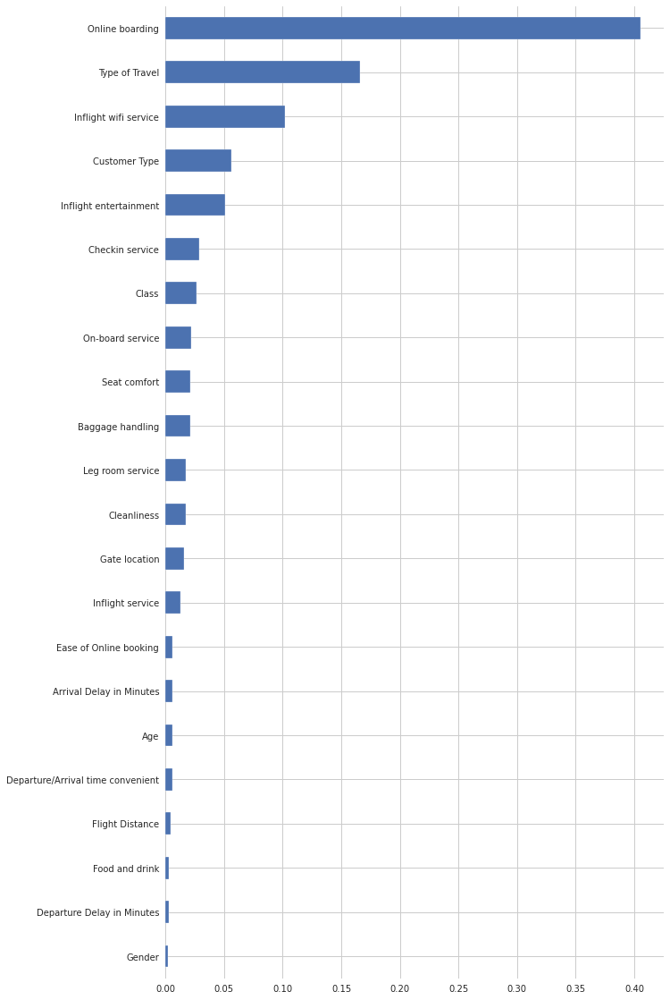

In [19]:
import matplotlib.pyplot as plt

model_xgboost = pipe_xgboost.named_steps['xgbclassifier']
importances_xgboost = pd.Series(model_xgboost.feature_importances_, X_train.columns)
plt.figure(figsize=(10, 20))
importances_xgboost.sort_values().plot.barh();

In [21]:
ore = OrdinalEncoder()

X_train_ordinal = ore.fit_transform(X_train)
X_val_ordinal = ore.transform(X_val)
X_test_ordinal = ore.transform(X_test)

In [22]:
X_train.columns

Index(['Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes',
       'Arrival Delay in Minutes'],
      dtype='object')

(<Figure size 1080x684 with 3 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f0473b99550>,
  'pdp_ax': {'_pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f0473769dc0>,
   '_count_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f047368d4f0>}})

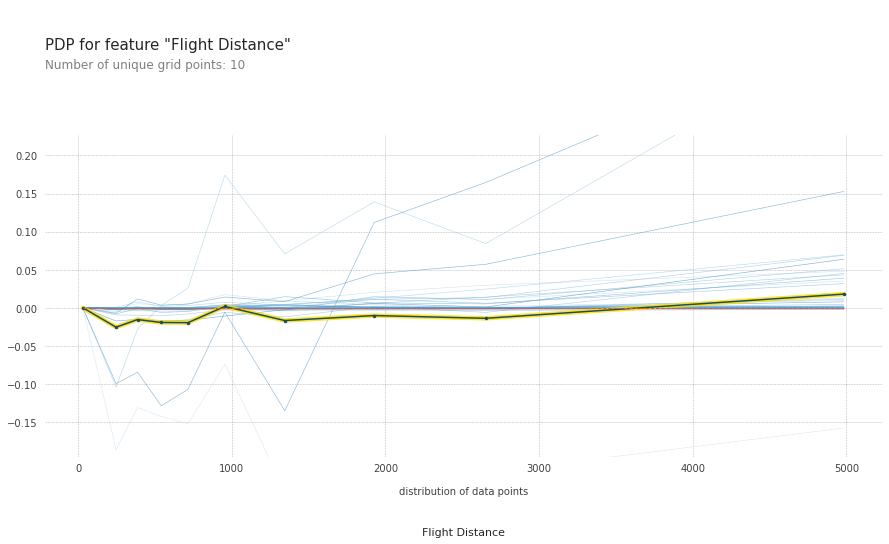

In [26]:
from pdpbox.pdp import pdp_isolate, pdp_plot

target_feature = "Flight Distance"

isolated = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    grid_type="percentile",  # default = 'percentile', or 'equal'
    num_grid_points=10,  # default = 10
)
pdp_plot(isolated, feature_name=target_feature,frac_to_plot=50,plot_lines=True,plot_pts_dist=True)

# 비행 거리가 짧으면 만족도가 의미없지만 아주 먼 비행일때가 그나마 만족도가 1일 확률이 높다.

(<Figure size 1080x684 with 3 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f04736250a0>,
  'pdp_ax': {'_pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f04735fb340>,
   '_count_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f047359fa30>}})

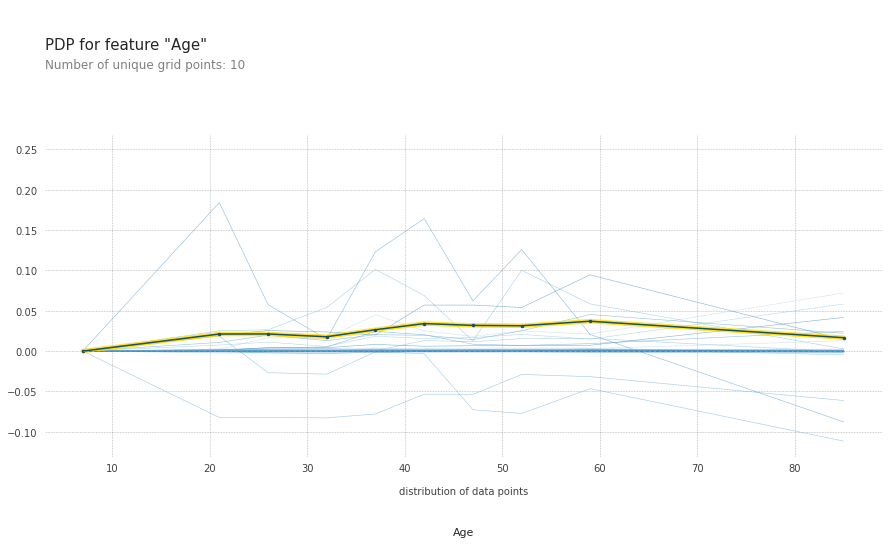

In [27]:
from pdpbox.pdp import pdp_isolate, pdp_plot

target_feature = "Age"

isolated = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    grid_type="percentile",  # default = 'percentile', or 'equal'
    num_grid_points=10,  # default = 10
)
pdp_plot(isolated, feature_name=target_feature,plot_lines=True,  # ICE plots
    frac_to_plot=50,  # float type을 입력하면 전체 데이터 갯수 중 plotting할 데이터 수의 비율이 됩니다. int type을 입력하면 데이터의 수가 됩니다.
    plot_pts_dist=True)


# 60대까지는 만족도가 증가하다가 그 이후엔 만족도가 낮아진다.

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f04733296a0>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f047331c040>})

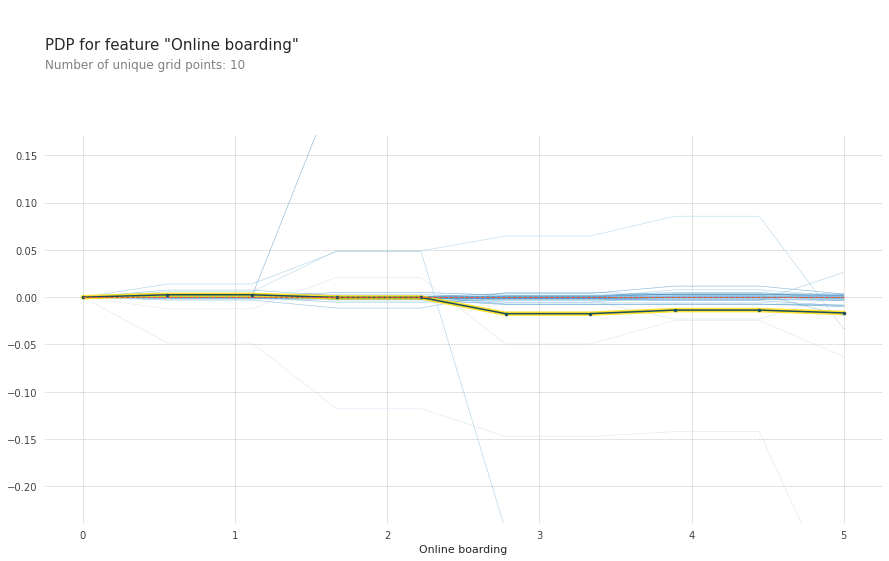

In [29]:
from pdpbox.pdp import pdp_isolate, pdp_plot

target_feature = "Online boarding"

isolated = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    grid_type="equal",  # default = 'percentile', or 'equal'
    num_grid_points=10,  # default = 10
)
pdp_plot(isolated, feature_name=target_feature,plot_pts_dist=False,plot_lines=True,frac_to_plot=50,)

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f0473082100>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f04730f38e0>})

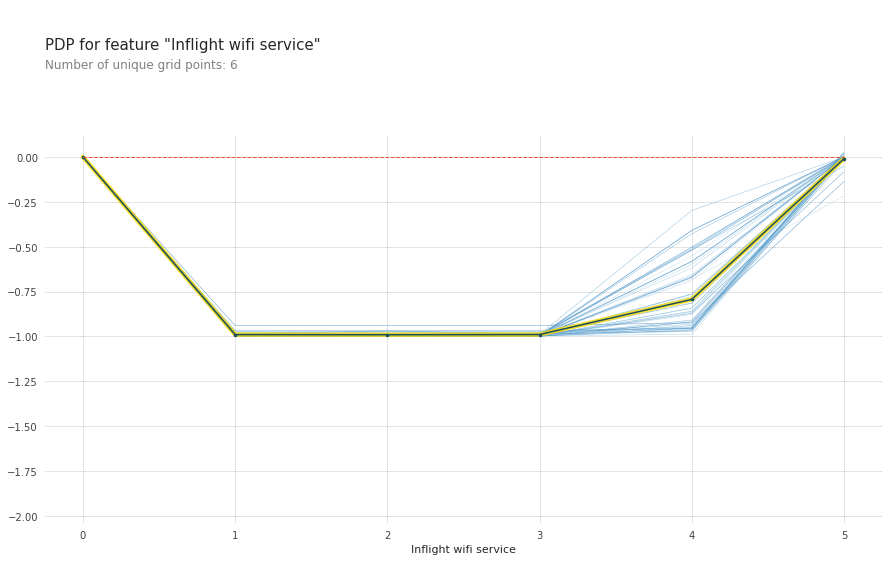

In [32]:
target_feature = "Inflight wifi service"

isolated = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    grid_type="percentile",  # default = 'percentile', or 'equal'
    num_grid_points=10,  # default = 10
)
pdp_plot(isolated, feature_name=target_feature,plot_pts_dist=False,plot_lines=True,frac_to_plot=50,)

(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f047322f280>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f0472fae430>})

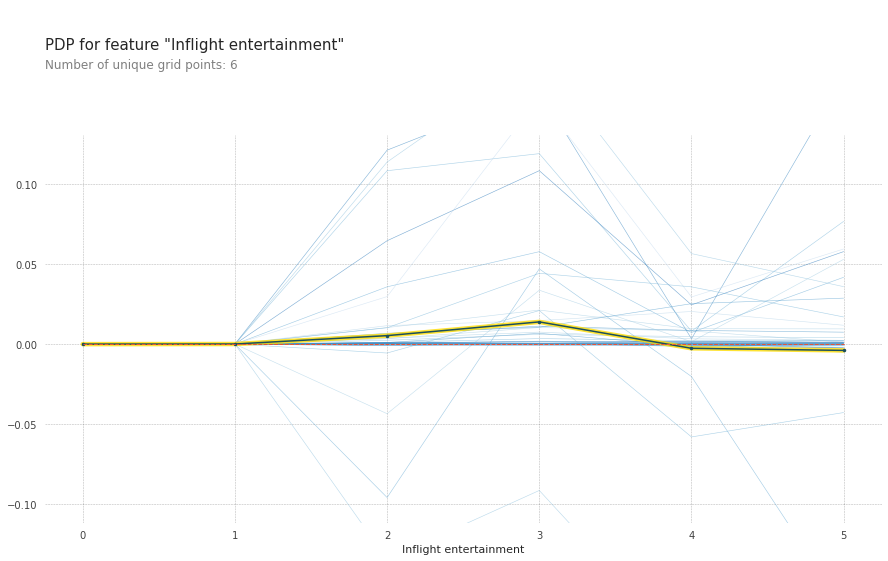

In [33]:
target_feature = "Inflight entertainment"

isolated = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    grid_type="percentile",  # default = 'percentile', or 'equal'
    num_grid_points=10,  # default = 10
)
pdp_plot(isolated, feature_name=target_feature,plot_pts_dist=False,plot_lines=True,frac_to_plot=50,)

[{'col': 'Gender', 'mapping': Male      1
Female    2
NaN      -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Customer Type', 'mapping': Loyal Customer       1
disloyal Customer    2
NaN                 -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Type of Travel', 'mapping': Personal Travel    1
Business travel    2
NaN               -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Class', 'mapping': Eco Plus    1
Business    2
Eco         3
NaN        -2
dtype: int64, 'data_type': dtype('O')}]


(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f4e13cd28e0>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f4e13277fd0>})

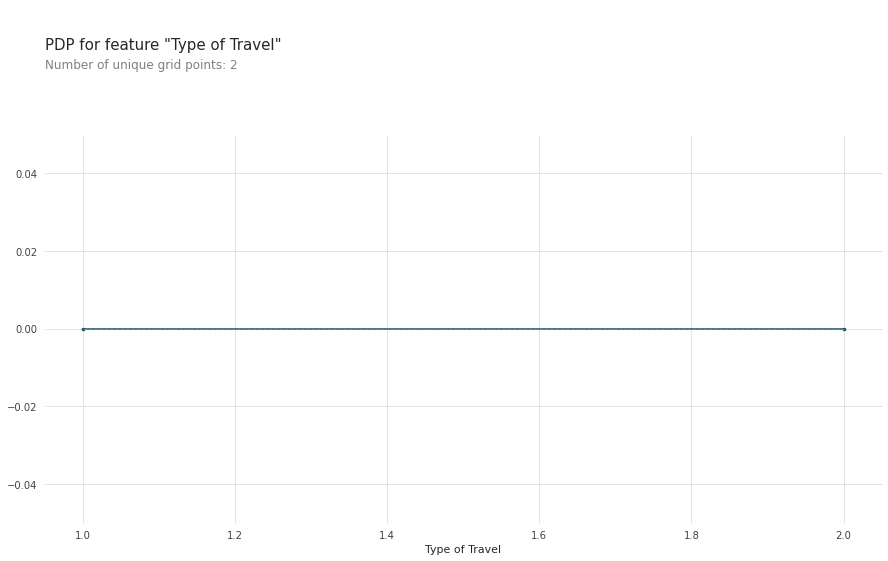

In [ ]:
target_feature = "Type of Travel"

# 학습 시 사용한 encoder로부터 각 특성값들을 어떤 수치값으로 매핑했는지 확인할 수 있습니다.
mappings = ore.mapping
print(mappings)


# mappings에서 우리가 보고자 하는 타겟 특성의 mapping을 꺼내 옵시다.
mapping_data = list(filter(lambda x: x["col"] == target_feature, mappings))
# mapping은 pandas series 형태로 저장되어 있습니다. index가 원래 값이고, value가 인코딩된 수치형 값입니다.
maps = mapping_data[0]["mapping"]


# 우선 인코딩된 후의 값을 기준으로 PDP를 그려 봅시다.
pdp_dist = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    cust_grid_points=[1,2],  # 특성값을 찍어 볼 지점을 직접 지정할 수 있습니다.
)
pdp_plot(pdp_dist, target_feature)  # 인코딩된 marital-status 값을 확인할 수 있습니다

[1, 2, -2] ['Personal Travel', 'Business travel', nan]


([<matplotlib.axis.XTick at 0x7f4e13bbaeb0>,
 [Text(0, 0, 'Personal Travel'),
  Text(0, 0, 'Business travel'),
  Text(0, 0, 'nan')])

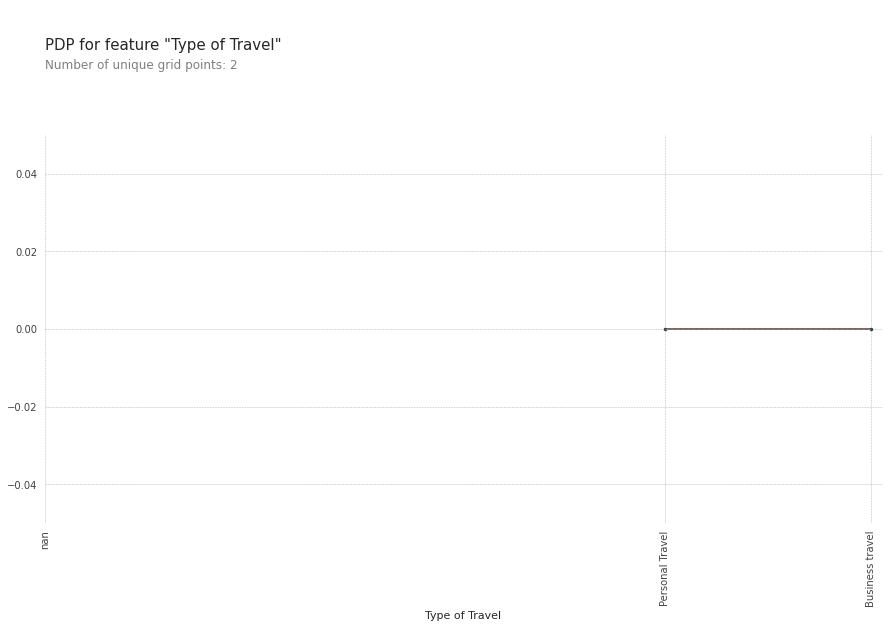

In [ ]:
# 인코딩된 특성값과 원래 특성값을 리스트로 가져옵니다.
encoded_features = maps.values.tolist()
original_features = maps.index.tolist()
print(encoded_features, original_features)

pdp_plot(pdp_dist, target_feature)

# plot의 x축에 표시될 값을 encoded features에서 original features로 매핑해 줍니다.
plt.xticks(encoded_features, original_features, rotation=90)

[{'col': 'Gender', 'mapping': Male      1
Female    2
NaN      -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Customer Type', 'mapping': Loyal Customer       1
disloyal Customer    2
NaN                 -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Type of Travel', 'mapping': Personal Travel    1
Business travel    2
NaN               -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Class', 'mapping': Eco Plus    1
Business    2
Eco         3
NaN        -2
dtype: int64, 'data_type': dtype('O')}]


(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f4e12554be0>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f4e126eaa30>})

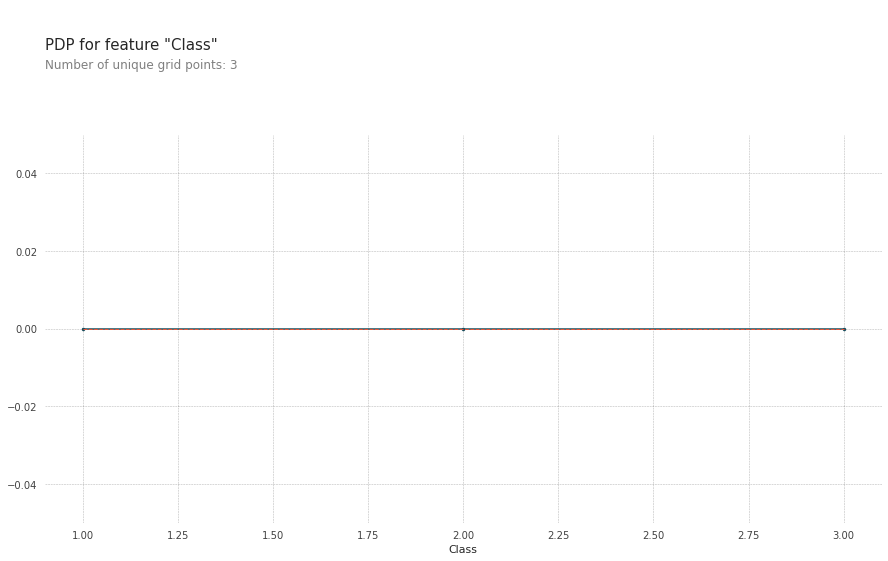

In [ ]:
target_feature = "Class"

# 학습 시 사용한 encoder로부터 각 특성값들을 어떤 수치값으로 매핑했는지 확인할 수 있습니다.
mappings = ore.mapping
print(mappings)


# mappings에서 우리가 보고자 하는 타겟 특성의 mapping을 꺼내 옵시다.
mapping_data = list(filter(lambda x: x["col"] == target_feature, mappings))
# mapping은 pandas series 형태로 저장되어 있습니다. index가 원래 값이고, value가 인코딩된 수치형 값입니다.
maps = mapping_data[0]["mapping"]


# 우선 인코딩된 후의 값을 기준으로 PDP를 그려 봅시다.
pdp_dist = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    cust_grid_points=[1,2,3],  # 특성값을 찍어 볼 지점을 직접 지정할 수 있습니다.
)
pdp_plot(pdp_dist, target_feature)  # 인코딩된 marital-status 값을 확인할 수 있습니다

[1, 2, 3, -2] ['Eco Plus', 'Business', 'Eco', nan]


([<matplotlib.axis.XTick at 0x7f4e13ccc8e0>,
 [Text(0, 0, 'Eco Plus'),
  Text(0, 0, 'Business'),
  Text(0, 0, 'Eco'),
  Text(0, 0, 'nan')])

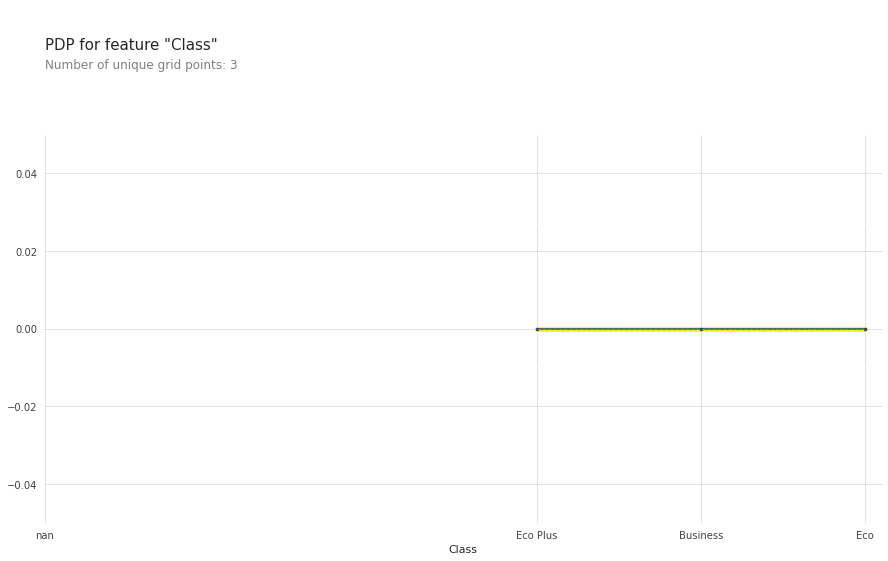

In [ ]:
# 인코딩된 특성값과 원래 특성값을 리스트로 가져옵니다.
encoded_features = maps.values.tolist()
original_features = maps.index.tolist()
print(encoded_features, original_features)

pdp_plot(pdp_dist, target_feature,plot_lines=True,frac_to_plot=50,)

# plot의 x축에 표시될 값을 encoded features에서 original features로 매핑해 줍니다.
plt.xticks(encoded_features, original_features, rotation=0)

[{'col': 'Gender', 'mapping': Male      1
Female    2
NaN      -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Customer Type', 'mapping': Loyal Customer       1
disloyal Customer    2
NaN                 -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Type of Travel', 'mapping': Personal Travel    1
Business travel    2
NaN               -2
dtype: int64, 'data_type': dtype('O')}, {'col': 'Class', 'mapping': Eco Plus    1
Business    2
Eco         3
NaN        -2
dtype: int64, 'data_type': dtype('O')}]


(<Figure size 1080x684 with 2 Axes>,
 {'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f4e12121af0>,
  'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f4e12121dc0>})

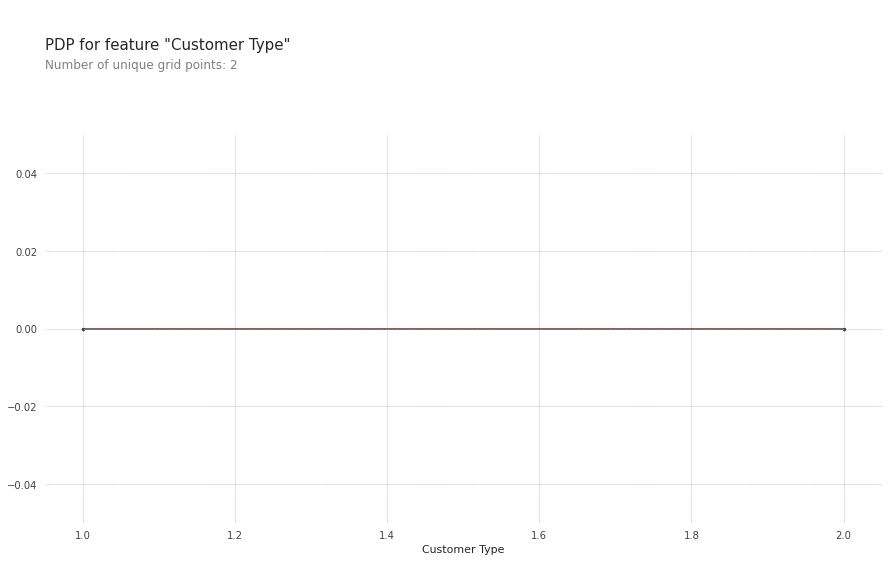

In [ ]:
target_feature = "Customer Type"

# 학습 시 사용한 encoder로부터 각 특성값들을 어떤 수치값으로 매핑했는지 확인할 수 있습니다.
mappings = ore.mapping
print(mappings)


# mappings에서 우리가 보고자 하는 타겟 특성의 mapping을 꺼내 옵시다.
mapping_data = list(filter(lambda x: x["col"] == target_feature, mappings))
# mapping은 pandas series 형태로 저장되어 있습니다. index가 원래 값이고, value가 인코딩된 수치형 값입니다.
maps = mapping_data[0]["mapping"]


# 우선 인코딩된 후의 값을 기준으로 PDP를 그려 봅시다.
pdp_dist = pdp_isolate(
    model=pipe_xgboost,
    dataset=X_val_ordinal,
    model_features=X_val.columns,
    feature=target_feature,
    cust_grid_points=[1,2],  # 특성값을 찍어 볼 지점을 직접 지정할 수 있습니다.
)
pdp_plot(pdp_dist, target_feature)  # 인코딩된 marital-status 값을 확인할 수 있습니다

[1, 2, -2] ['Loyal Customer', 'disloyal Customer', nan]


([<matplotlib.axis.XTick at 0x7f4e12065490>,
 [Text(0, 0, 'Loyal Customer'),
  Text(0, 0, 'disloyal Customer'),
  Text(0, 0, 'nan')])

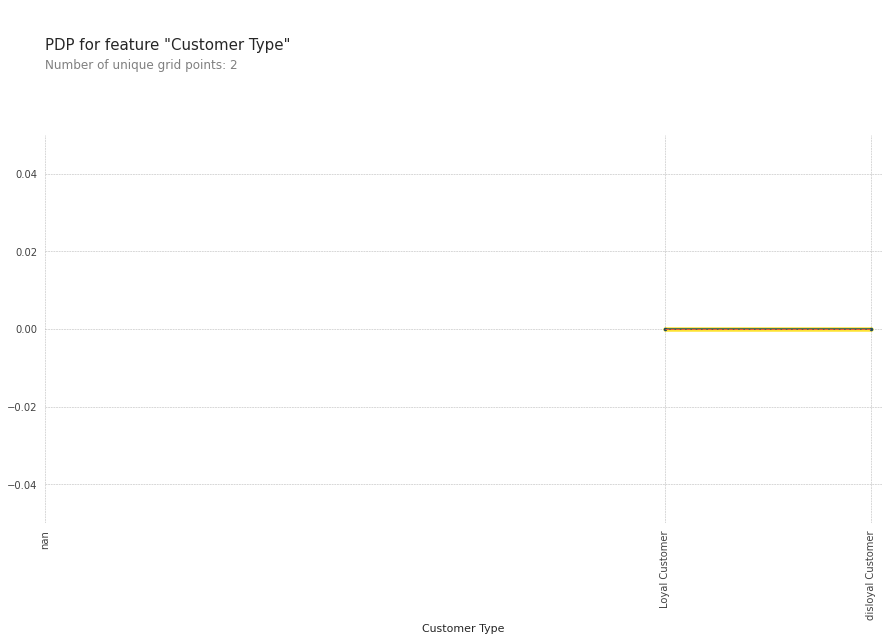

In [ ]:
# 인코딩된 특성값과 원래 특성값을 리스트로 가져옵니다.
encoded_features = maps.values.tolist()
original_features = maps.index.tolist()
print(encoded_features, original_features)

pdp_plot(pdp_dist, target_feature, plot_lines=True,frac_to_plot=50,)

# plot의 x축에 표시될 값을 encoded features에서 original features로 매핑해 줍니다.
plt.xticks(encoded_features, original_features, rotation=90)